<a href="https://colab.research.google.com/github/katedriebe/Group1Project3/blob/main/Project3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Import Libarys
from PIL import Image
import matplotlib.pyplot as plt
import io
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import os
import pandas as pd
import matplotlib.pyplot as plt
import torch.nn as nn



In [ ]:
from google.colab import files
uploaded = files.upload()

for filename in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=filename, length=len(uploaded[filename])))



Saving AA_hk_01.jpg to AA_hk_01.jpg
Saving D-4hIQKUcAcyh49.jpg to D-4hIQKUcAcyh49.jpg
Saving EBtpqTMUIAAq9dJ.jpg to EBtpqTMUIAAq9dJ.jpg
Saving EC0CTh6UEAUlO3U.jpg to EC0CTh6UEAUlO3U.jpg
Saving EC0CTh9UUAAKPmx.jpg to EC0CTh9UUAAKPmx.jpg
Saving EC0E09cU4AA64T1.jpg to EC0E09cU4AA64T1.jpg
Saving EC0e9bmVUAASu3b.jpg to EC0e9bmVUAASu3b.jpg
Saving EC0Iaa4U8AA2nJ5.jpg to EC0Iaa4U8AA2nJ5.jpg
Saving EC0Iaa4UUAAHM6t.jpg to EC0Iaa4UUAAHM6t.jpg
Saving EC0SY18UEAA4HnU.jpg to EC0SY18UEAA4HnU.jpg
Saving EC0ZKW8U8AICqJv.jpg to EC0ZKW8U8AICqJv.jpg
Saving EC1IAr5VAAEXtz2.jpg to EC1IAr5VAAEXtz2.jpg
Saving EC1IAr6U8AAydgn.jpg to EC1IAr6U8AAydgn.jpg
Saving EC1IAr6UEAUW1eW.jpg to EC1IAr6UEAUW1eW.jpg
Saving EC1IAr7VAAASE3R.jpg to EC1IAr7VAAASE3R.jpg
Saving EC1L9x3UEAAdIRy.jpg to EC1L9x3UEAAdIRy.jpg
Saving EC3J7fZVUAAKvPQ.jpg to EC3J7fZVUAAKvPQ.jpg
Saving EC3uvnfUYAAQfeZ.jpg to EC3uvnfUYAAQfeZ.jpg
Saving EC4IhP_UUAE4p8F.jpg to EC4IhP_UUAE4p8F.jpg
Saving EC4QIzFUwAAeleB.jpg to EC4QIzFUwAAeleB.jpg
Saving EC4QJnN

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from PIL import Image
import os
import pandas as pd
from tqdm import tqdm


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


class ModifiedResNet50(nn.Module):
    def __init__(self, num_classes=12):
        super(ModifiedResNet50, self).__init__()
        original_model = models.resnet50(pretrained=True)
        self.features = nn.Sequential(*list(original_model.children())[:-1])
        self.classifier = nn.Linear(original_model.fc.in_features, num_classes)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return self.sigmoid(x)


class ImageDataset(Dataset):
    def __init__(self, img_paths, transform=None):
        self.img_paths = img_paths
        self.transform = transform

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, index):
        img_path = self.img_paths[index]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, os.path.basename(img_path)

# Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


img_dir = '/content'
img_paths = [os.path.join(img_dir, f) for f in os.listdir(img_dir) if f.endswith('.jpg')]

dataset = ImageDataset(img_paths=img_paths, transform=transform)
data_loader = DataLoader(dataset, batch_size=16, shuffle=False)

# Load model
model = ModifiedResNet50().to(device)


model.eval()  # Set model to evaluate mode

# Evaluate
results = []
with torch.no_grad():
    for inputs, img_names in tqdm(data_loader, desc="Evaluating"):
        inputs = inputs.to(device)
        outputs = model(inputs)
        predictions = outputs.cpu().data.numpy()
        for img_name, prediction in zip(img_names, predictions):
            results.append((img_name, *prediction))

# Save evaluation results to a CSV file
df_results = pd.DataFrame(results, columns=['ImageName', 'Protest', 'Violence', 'Sign', 'Photo', 'Fire', 'Police', 'Children', 'Group_20', 'Group_100', 'Flag', 'Night', 'Shouting'])
df_results.to_csv('evaluation_results.csv', index=False)
print(df_results.head())

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Evaluating: 100%|██████████| 5/5 [00:12<00:00,  2.56s/it]

             ImageName   Protest  Violence      Sign     Photo      Fire  \
0        main_1502.jpg  0.599411  0.748521  0.541325  0.473421  0.501474   
1  EC1IAr6U8AAydgn.jpg  0.600290  0.730775  0.474996  0.421931  0.433081   
2  ECj5gX2U8AApwRS.jpg  0.545139  0.693071  0.430003  0.420211  0.450182   
3  ECu24A0U0AARyHs.jpg  0.552525  0.671324  0.462987  0.441231  0.459010   
4  ECp_Hu8U0AAW9tD.jpg  0.556842  0.674844  0.570618  0.421757  0.498458   

     Police  Children  Group_20  Group_100      Flag     Night  Shouting  
0  0.389682  0.482403  0.480498   0.472863  0.407573  0.390158  0.554360  
1  0.574285  0.333144  0.393624   0.515683  0.357608  0.586104  0.628501  
2  0.412939  0.495427  0.497023   0.545465  0.522828  0.474980  0.595083  
3  0.467920  0.478661  0.440539   0.481174  0.493776  0.469124  0.515220  
4  0.432959  0.415493  0.491893   0.500921  0.448980  0.501657  0.552823  


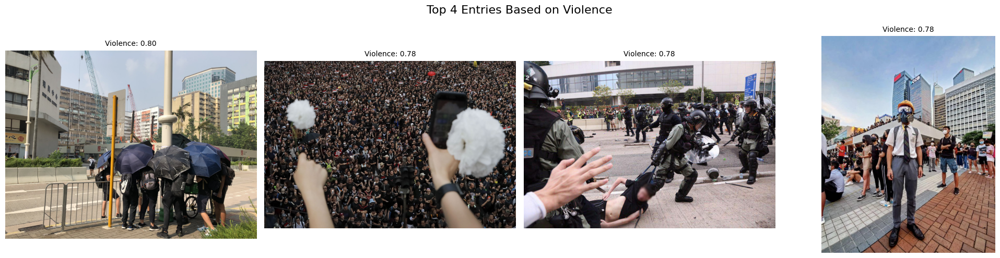

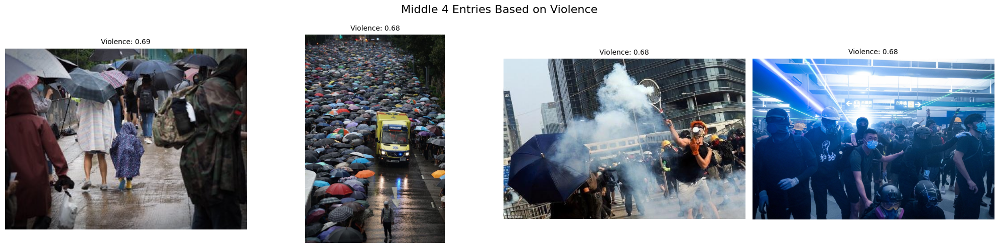

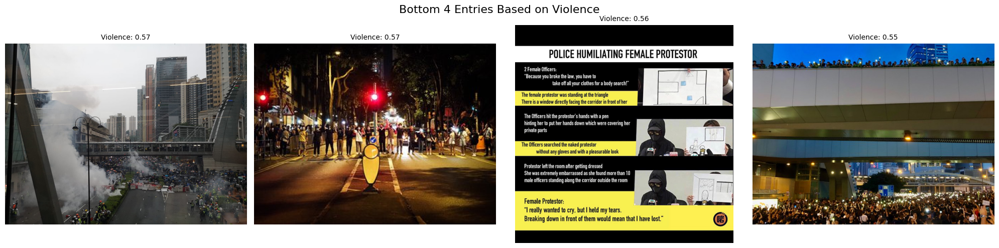

In [ ]:

import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt


df_results = pd.read_csv('evaluation_results.csv')
df_sorted = df_results.sort_values('Violence', ascending=False)
top_entries = df_sorted.head(4)
middle_index = len(df_sorted) // 2
middle_entries = df_sorted.iloc[middle_index-2:middle_index+2]
last_entries = df_sorted.tail(4)


image_path = '/content/'


def plot_images(entries, title):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(title, fontsize=16)
    for ax, (_, row) in zip(axes, entries.iterrows()):
        img = Image.open(os.path.join(image_path, row['ImageName']))
        ax.imshow(img)
        ax.axis('off')  # Hide the axes ticks
        ax.set_title(f"Violence: {row['Violence']:.2f}", fontsize=10)
    plt.tight_layout()
    plt.show()

# Plot the top, middle, and bottom entries
plot_images(top_entries, "Top 4 Entries Based on Violence")
plot_images(middle_entries, "Middle 4 Entries Based on Violence")
plot_images(last_entries, "Bottom 4 Entries Based on Violence")


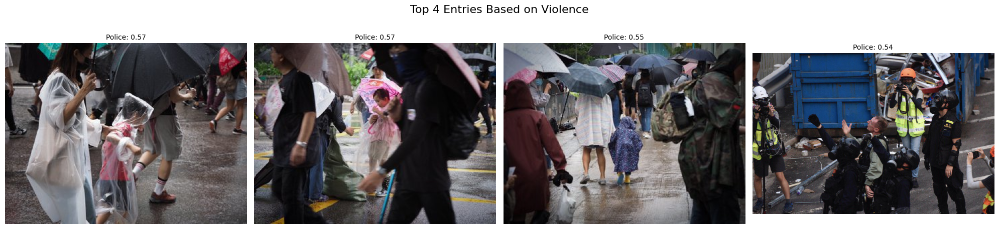

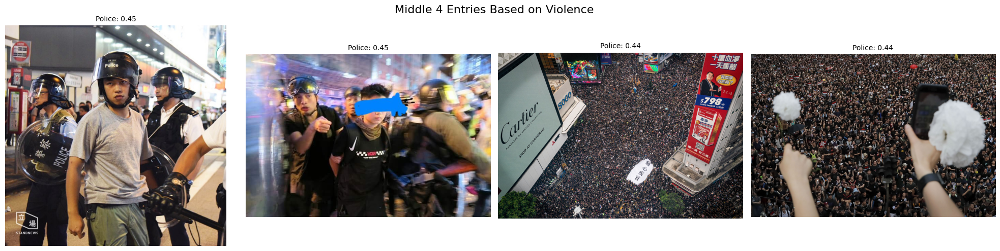

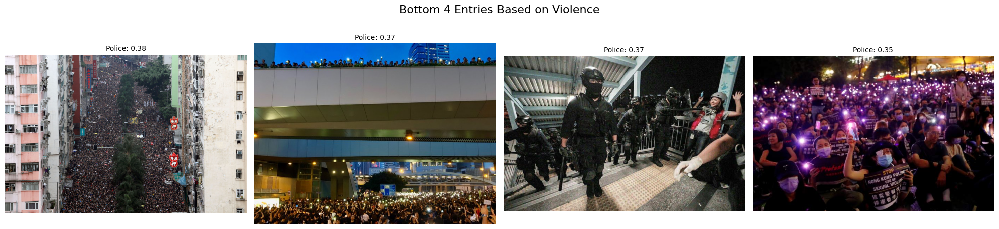

In [ ]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt


df_results = pd.read_csv('evaluation_results.csv')
df_sorted = df_results.sort_values('Police', ascending=False)
top_entries = df_sorted.head(4)
middle_index = len(df_sorted) // 2
middle_entries = df_sorted.iloc[middle_index-2:middle_index+2]
last_entries = df_sorted.tail(4)


image_path = '/content/'


def plot_images(entries, title):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(title, fontsize=16)
    for ax, (_, row) in zip(axes, entries.iterrows()):
        img = Image.open(os.path.join(image_path, row['ImageName']))
        ax.imshow(img)
        ax.axis('off')  # Hide the axes ticks
        ax.set_title(f"Police: {row['Police']:.2f}", fontsize=10)
    plt.tight_layout()
    plt.show()

# Plot the top, middle, and bottom entries
plot_images(top_entries, "Top 4 Entries Based on Violence")
plot_images(middle_entries, "Middle 4 Entries Based on Violence")
plot_images(last_entries, "Bottom 4 Entries Based on Violence")

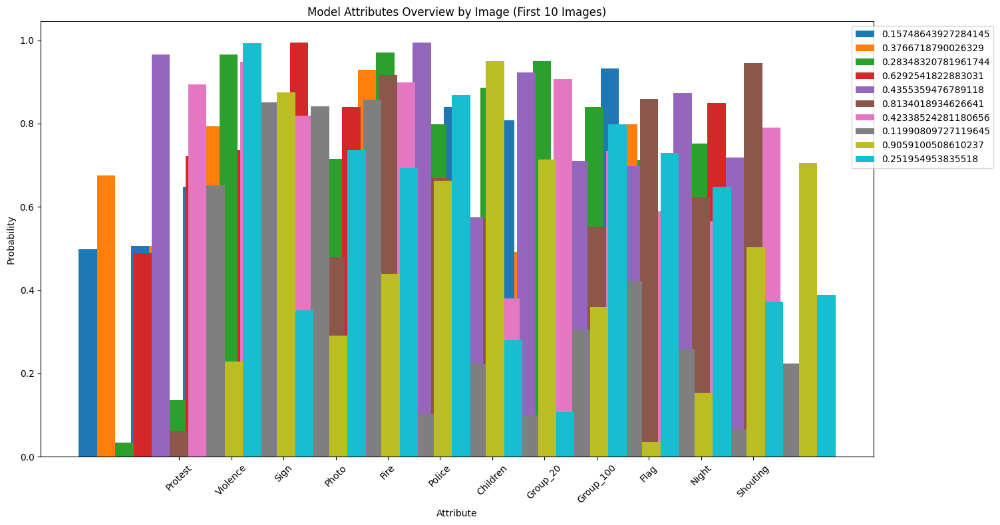

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Sample DataFrame, replace this with your actual DataFrame
columns = ['ImageName', 'Protest', 'Violence', 'Sign', 'Photo', 'Fire', 'Police', 'Children', 'Group_20', 'Group_100', 'Flag', 'Night', 'Shouting']
data = np.random.rand(10, 13)  # Random data, replace with your DataFrame's values
df_results_sample = pd.DataFrame(data, columns=columns)

# Plotting the graph for the first 10 images
data = df_results_sample.iloc[:10, 1:].values  # Excluding ImageName column
n_images, n_attributes = data.shape

fig, ax = plt.subplots(figsize=(15, 8))
bar_width = 0.35
index = np.arange(n_attributes)

for i in range(n_images):
    plt.bar(index + bar_width * i, data[i], bar_width, label=df_results_sample['ImageName'][i])

plt.xlabel('Attribute')
plt.ylabel('Probability')
plt.title('Model Attributes Overview by Image (First 10 Images)')
plt.xticks(index + bar_width / 2 * n_images, df_results_sample.columns[1:], rotation=45)
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), ncol=1)
plt.tight_layout()
plt.show()

# The code to display the images is not included as matplotlib cannot handle it directly.
# You would need to use additional libraries or front-end frameworks to display the images alongside the graph.


NameError: name 'ImageGrid' is not defined

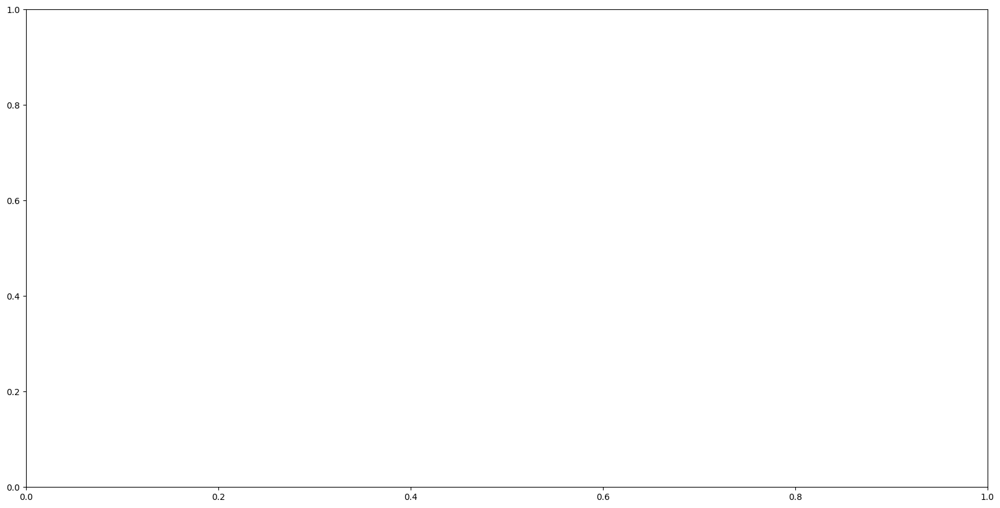

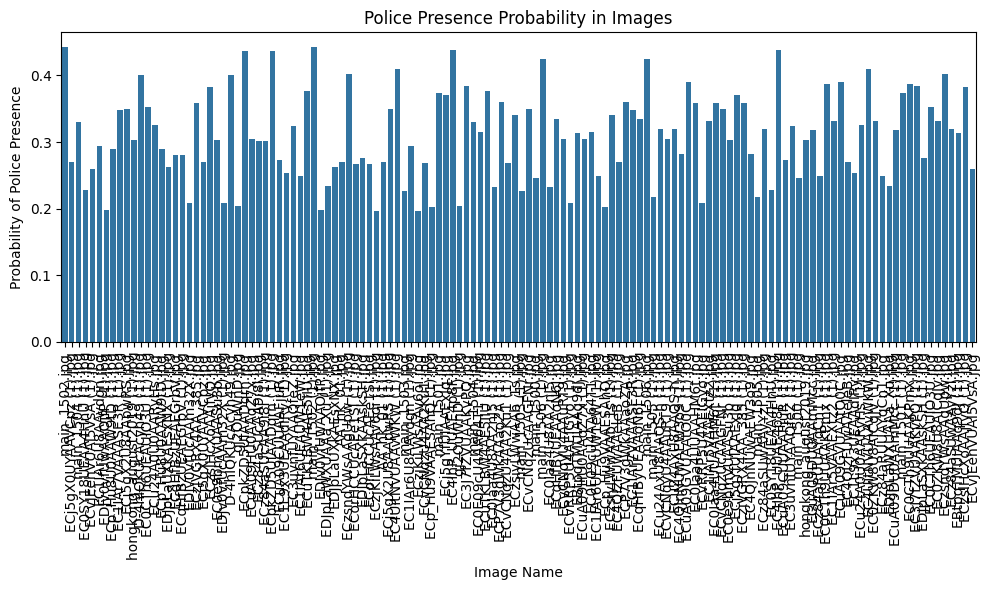

In [ ]:
# Example for 'Police' presence attribute
plt.figure(figsize=(10, 6))
sns.barplot(x='ImageName', y='Police', data=df_results)
plt.xticks(rotation=90)
plt.xlabel('Image Name')
plt.ylabel('Probability of Police Presence')
plt.title('Police Presence Probability in Images')
plt.tight_layout()
plt.show()


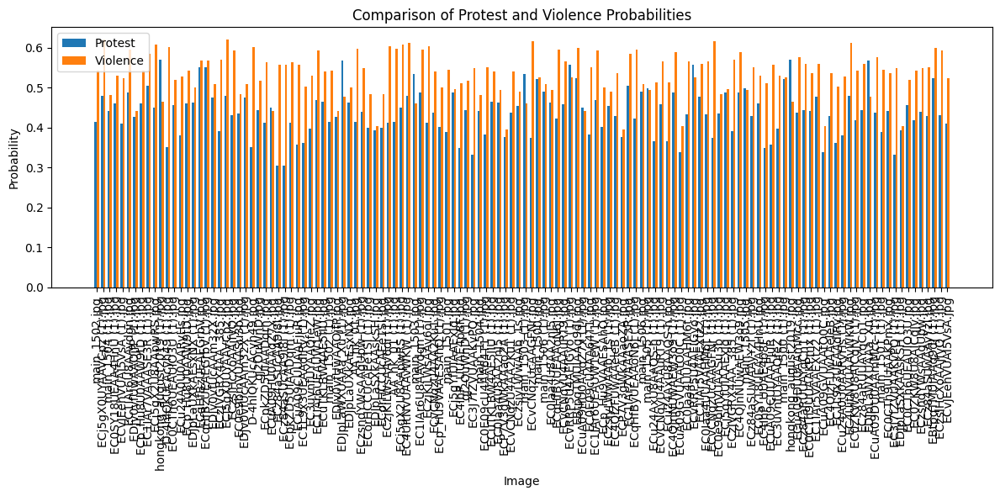

In [ ]:
# Example comparing 'Protest' and 'Violence' probabilities
plt.figure(figsize=(12, 6))
width = 0.35
index = np.arange(len(df_results))

plt.bar(index, df_results['Protest'], width, label='Protest')
plt.bar(index + width, df_results['Violence'], width, label='Violence')

plt.xlabel('Image')
plt.ylabel('Probability')
plt.title('Comparison of Protest and Violence Probabilities')
plt.xticks(index + width / 2, df_results['ImageName'], rotation=90)
plt.legend()

plt.tight_layout()
plt.show()


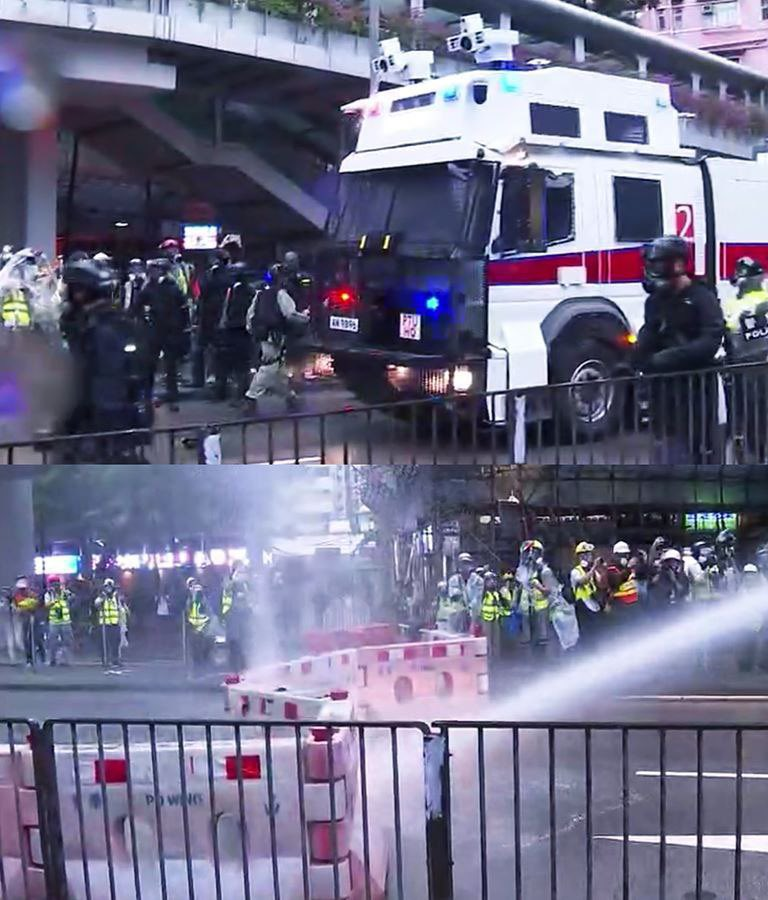

In [ ]:
from IPython.display import Image, display
image_name = 'EC0CTh6UEAUlO3U.jpg'
display(Image(image_name))
